<h1 style="background-color:#6CA8D8;font-family: Calibri;font-weight:bold;color:#eff7f6;padding: 12px; font-size: 30px; color: #081c15;border-radius:200px 200px; text-align: center; line-height: 1.25;"><br><span style="color: #1b4332; font-size: 48px"><b>🎥Movies Recommender System</b></span>

# Overview: 

<p style="color:#26947C;font-size:18px"> A recommender system is an engine or platform that can anticipate which movie(s) a user would most likely find interesting based on statistics. The recommender system used by streaming juggernaut Netflix to propose material to users in an effort to enhance platform usage is a good example. All of the user-generated data is used by the system's multiple recommender engines as actionable like-dislike data.Since personalized recommendations are convenient and save the user time, a recommender system improves the user's experience.</p>

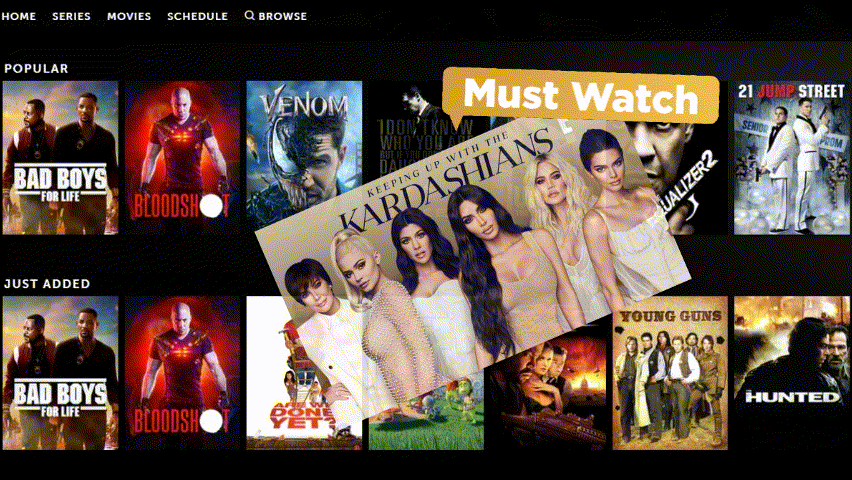

# Abstract: 

<p style="color:#26947C;font-size:18px">By using a movie rating dataset, we would be developing a recommender system using cosine similarity that will provide movie recommendations based on the input. The recommendation will be provided based on content based like age, location, gender, etc. and collaborative filtering based like previous similar users, previous behavior, etc. For collaborative filtering we will be using DEEP Learning framework such as Tensorflow, we will predict the movies a particular user should watch based on the historical data of ratings provided by that particular user.</p>

1. [Data Preparation](#data)  


2. [Exploratory Data Analysis](#eda)


3. [Movie Recommender System](#recommender)

    3.1 [Simple Recommender based on movie rating](#simple)
    
    3.2 [Content based recommender](#content)
    
    3.3 [Collaborative Filtering based recommender(Deep Learning | TensorFlow)](#collaborative)


4. [Summary](#summary)
    


<h1 style="background-color:#6CA8D8;font-family: Calibri;font-weight:bold;color:#eff7f6;padding: 10px; font-size: 30px; color: #081c15;border-radius:100px 100px; text-align: center; line-height: 0.5;"><br><span style="color: #1b4332; font-size: 30px"><b id=data>Data Preparation</b></span>

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [6]:
df= pd.read_csv('C:\\DataScience_Mahesh\\movie_metadata.csv', delimiter=',')
df.head()

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,...,3054.0,English,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000
1,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,...,1238.0,English,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0
2,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,...,994.0,English,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000
3,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,...,2701.0,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000
4,NaN,Doug Walker,NaN,NaN,131.0,NaN,Rob Walker,131.0,NaN,Documentary,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,7.1,NaN,0


In [10]:
print('shape of the dataset=', df.shape)

print(' \nThe null count of each column of the dataset are as follows:')
df.isnull().sum()

shape of the dataset= (5043, 28)
 
The null count of each column of the dataset are as follows:


color                         19
director_name                104
num_critic_for_reviews        50
duration                      15
director_facebook_likes      104
actor_3_facebook_likes        23
actor_2_name                  13
actor_1_facebook_likes         7
gross                        884
genres                         0
actor_1_name                   7
movie_title                    0
num_voted_users                0
cast_total_facebook_likes      0
actor_3_name                  23
facenumber_in_poster          13
plot_keywords                153
movie_imdb_link                0
num_user_for_reviews          21
language                      12
country                        5
content_rating               303
budget                       492
title_year                   108
actor_2_facebook_likes        13
imdb_score                     0
aspect_ratio                 329
movie_facebook_likes           0
dtype: int64

In [11]:
df.info()  # Information of the dataset, in terms of shape of dataset,name , type and non null values wrt each column.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5043 entries, 0 to 5042
Data columns (total 28 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   color                      5024 non-null   object 
 1   director_name              4939 non-null   object 
 2   num_critic_for_reviews     4993 non-null   float64
 3   duration                   5028 non-null   float64
 4   director_facebook_likes    4939 non-null   float64
 5   actor_3_facebook_likes     5020 non-null   float64
 6   actor_2_name               5030 non-null   object 
 7   actor_1_facebook_likes     5036 non-null   float64
 8   gross                      4159 non-null   float64
 9   genres                     5043 non-null   object 
 10  actor_1_name               5036 non-null   object 
 11  movie_title                5043 non-null   object 
 12  num_voted_users            5043 non-null   int64  
 13  cast_total_facebook_likes  5043 non-null   int64

Please find the details for the datset attributes:-

    Color :- Movie is black or coloured
    Director_name:- Name of the movie director
    num_critic_for_reviews :- No of critics for the movie
    duration:- movie duration in minutes
    director_facebook_likes:-Number of likes for the Director on his Facebook Page
    actor_3_facebook_likes:- No of likes for the actor 3 on his/her facebook Page
    actor2_name:- name of the actor 2
    actor_1_facebook_likes:- No of likes for the actor 1 on his/her facebook Page
    gross:- Gross earnings of the movie in Dollars
    genres:- Film categorization like ‘Animation’, ‘Comedy’, ‘Romance’, ‘Horror’, ‘Sci-Fi’, ‘Action’, ‘Family’
    actor_1_name:- Name of the actor 1
    movie_title:-Title of the movie
    num_voted_users:-No of people who voted for the movie
    cast_total_facebook_likes:- Total facebook like for the movie
    actor_3_name:- Name of the actor 3
    facenumber_in_poster:- No of actors who featured in the movie poster
    plot_keywords:-Keywords describing the movie plots
    movie_imdb_link:-Link of the movie link
    num_user_for_reviews:- Number of users who gave a review
    language:- Language of the movie
    country:- Country where movie is produced
    content_rating:- Content rating of the movie
    budget:- Budget of the movie in Dollars
    title_year:- The year in which the movie is released
    actor_2_facebook_likes:- facebook likes for the actor 2
    imdb_score:- IMDB score of the movie
    aspect_ratio :- Aspect ratio the movie was made in
    movie_facebook_likes:- Total no of facebook likes for the movie

<h1 style="background-color:#6CA8D8;font-family: Calibri;font-weight:bold;color:#eff7f6;padding: 10px; font-size: 30px; color: #081c15;border-radius:100px 100px; text-align: center; line-height: 0.5;"><br><span style="color: #1b4332; font-size: 30px"><b id=eda>Exploratory Data Analysis</b></span>

<p style="color:#26947C;font-size: 18px">First and foremost, an EDA is always available to help us understand the type of data we are working with. Additionally, learning from data might provide you with some insights, facts, and even errors.</p>

<h1 style="font-family: Trebuchet MS; font-size: 25px; color: #3a5a40; text-align: left; "><b>● Visualization 1</b></h1>

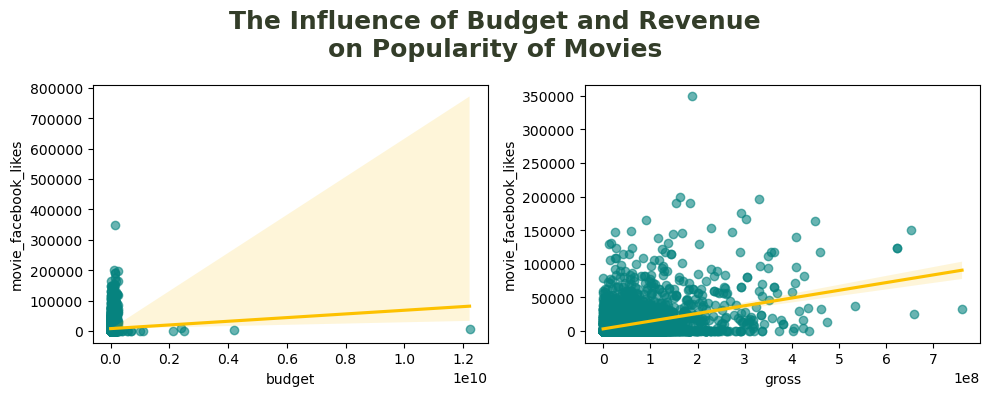

In [22]:
df_plot = df[(df['budget'] != 0) & (df['gross'] != 0)]

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

plt.suptitle('The Influence of Budget and Revenue\non Popularity of Movies', fontsize=18, weight=600, color='#333d29')
for i, col in enumerate(['budget', 'gross']):
    sns.regplot(data=df_plot, x=col, y='movie_facebook_likes',
                scatter_kws={"color": "#06837f", "alpha": 0.6}, line_kws={"color": "#fdc100"}, ax=axes[i])

plt.tight_layout()

### <h1 style="font-family: Trebuchet MS; font-size: 18px; color: #729b79; text-align: left; "><b>Summary:</b></h1>

* ####  Budget and Revenue just slighly influence the popularity of the movies

In [26]:
!pip install wordcloud

     -------------------------------------- 153.1/153.1 kB 4.6 MB/s eta 0:00:00


<h1 style="font-family: Trebuchet MS; font-size: 25px; color: #3a5a40; text-align: left; "><b>● Visualization 2</b></h1>

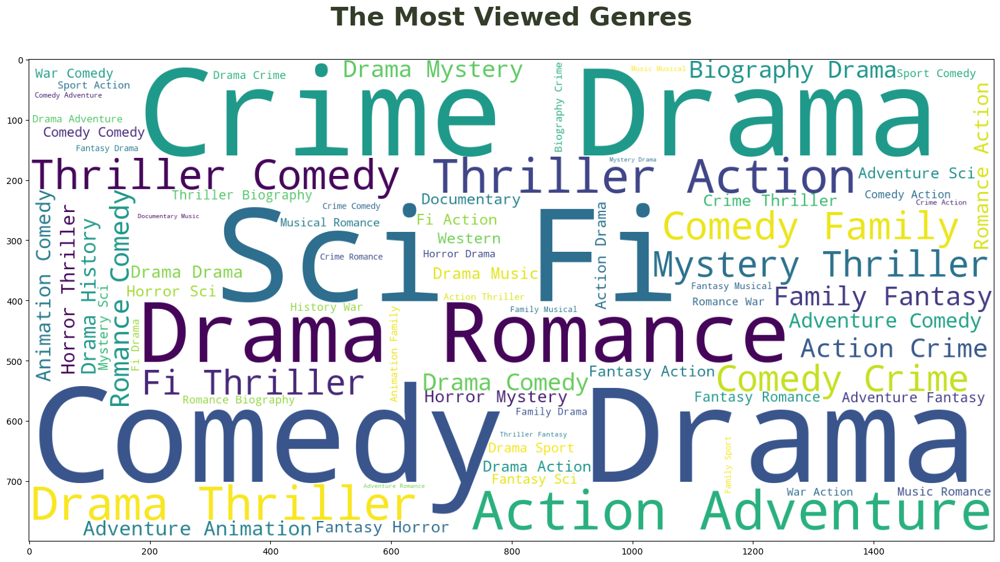

In [45]:




from wordcloud import WordCloud

plt.figure(figsize=(20,20))
plt.title('The Most Viewed Genres\n', fontsize=30, weight=600, color='#333d29')
wc = WordCloud(max_words=1000, min_font_size=10,
                height=800,width=1600,background_color="white").generate(' '.join(df['genres']))

plt.imshow(wc)

### <h1 style="font-family: Trebuchet MS; font-size: 18px; color: #729b79; text-align: left; "><b>Summary:</b></h1>

* ####  Drama,comedy, Sci Fi and Crime Drama are the most dominant genre.


<h1 style="font-family: Trebuchet MS; font-size: 25px; color: #3a5a40; text-align: left; "><b>● Visualization 3</b></h1>

Text(0.5, 1.0, 'Total Released Movie by Date')

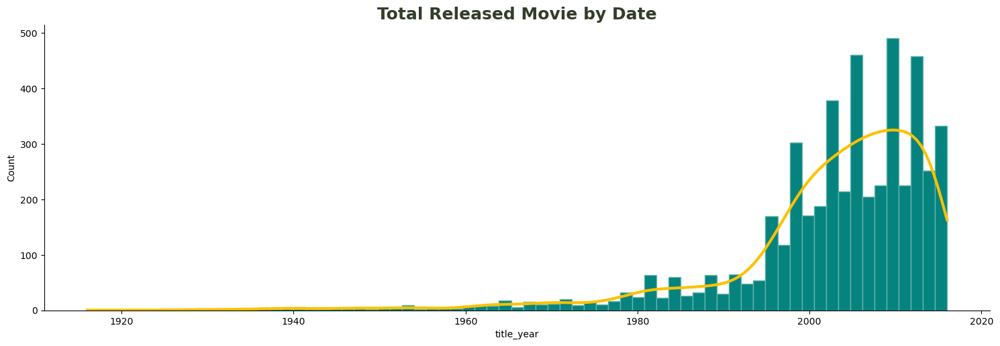

In [37]:
sns.displot(data=df, x='title_year', kind='hist', kde=True,
            color='#fdc100', facecolor='#06837f', edgecolor='#64b6ac', line_kws={'lw': 3}, aspect=3)
plt.title('Total Released Movie by Date', fontsize=18, weight=600, color='#333d29')

### <h1 style="font-family: Trebuchet MS; font-size: 18px; color: #729b79; text-align: left; "><b>Summary:</b></h1>

* ####  Movie Released after 1990 seems to have been significantly increased.


<h1 style="font-family: Trebuchet MS; font-size: 25px; color: #3a5a40; text-align: left; "><b>● Visualization 4</b></h1>

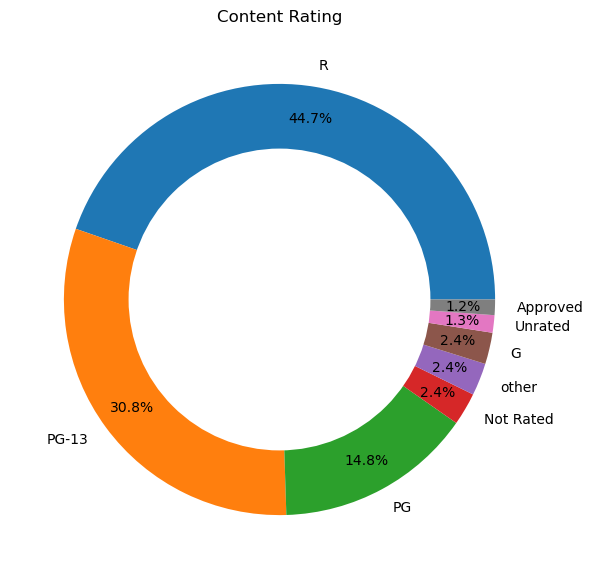

In [53]:
df.loc[df['content_rating'].isin((df['content_rating'].value_counts()[df['content_rating'].value_counts() < 50]).index), 'content_rating'] = 'other'
x = df.content_rating.value_counts().index
y = df.content_rating.value_counts().values
plt.figure(figsize=(7,7))
plt.pie(y, labels=x,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.title('Content Rating')
plt.show()


### <h1 style="font-family: Trebuchet MS; font-size: 18px; color: #729b79; text-align: left; "><b>Summary:</b></h1>

* ####  Maximum number of movies have been rated as R due to explicit content.

* ####  Followed by PG-13,PG and so on.


<h1 style="font-family: Trebuchet MS; font-size: 25px; color: #3a5a40; text-align: left; "><b>● Visualization 5</b></h1>

Text(0.5, 1.0, 'The Relationship Between Rating and Popularity')

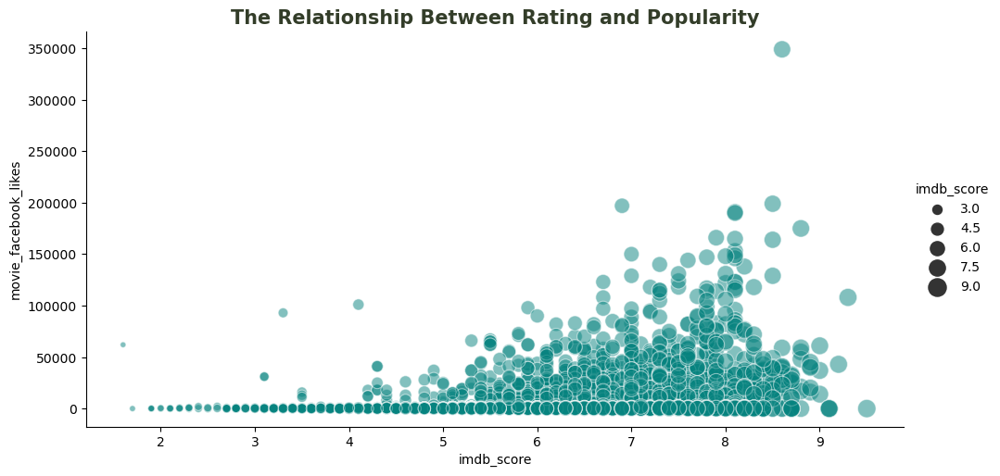

In [46]:
sns.relplot(data=df, x='imdb_score', y='movie_facebook_likes', size='imdb_score',
            sizes=(20, 200), alpha=.5, aspect=2, color='#06837f')
plt.title('The Relationship Between Rating and Popularity', fontsize=15, weight=600, color='#333d29')

### <h1 style="font-family: Trebuchet MS; font-size: 18px; color: #729b79; text-align: left; "><b>Summary:</b></h1>

* ####  From the graph, we could see that the most popular movies have an imdb score of 6 or more. 
* ####  The ones with low popularity have comparatively less rating.


<h1 style="font-family: Trebuchet MS; font-size: 25px; color: #3a5a40; text-align: left; "><b>● Visualization 6</b></h1>

Text(0.5, 1.0, 'IMDB score vs Language')

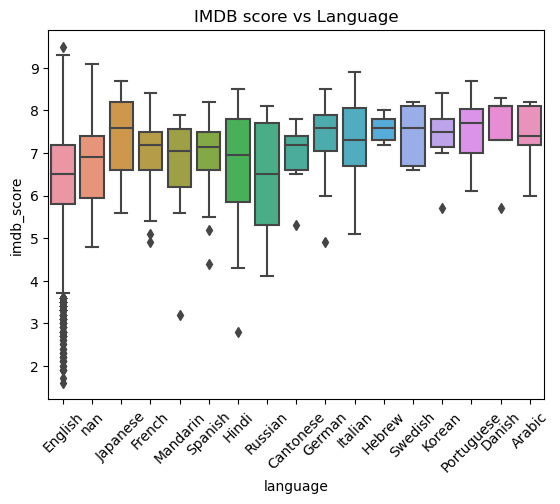

In [54]:
lang = df['language'].value_counts()
lang = lang[lang>4].index.tolist()
sns.boxplot(y='imdb_score', x='language', data=df[df['language'].isin(lang)])
plt.xticks(rotation=45)
plt.title('IMDB score vs Language')

### <h1 style="font-family: Trebuchet MS; font-size: 18px; color: #729b79; text-align: left; "><b>Summary:</b></h1>

* #### We can see that the highest and lowest rated movie is in English language that also suggest that it has the most outliers compared to others.

* ####  Japenese, Italian and Swedish language movies have a good amount of high scored movies followed by Hindi and Russian language movies.


<h1 style="font-family: Trebuchet MS; font-size: 25px; color: #3a5a40; text-align: left; "><b>● Visualization 7</b></h1>

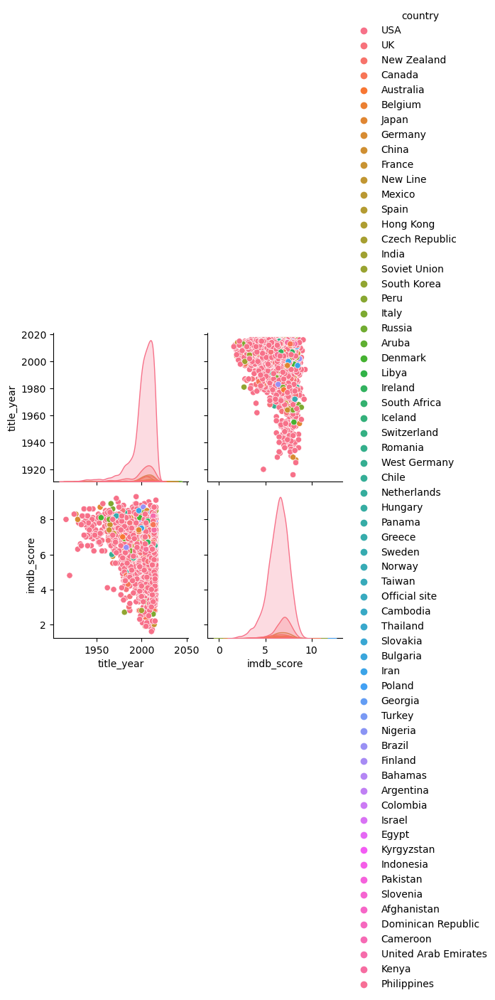

In [55]:
sns.pairplot(df[['title_year','imdb_score', 'country']], hue='country')
# plt.show()

### <h1 style="font-family: Trebuchet MS; font-size: 18px; color: #729b79; text-align: left; "><b>Summary:</b></h1>

* ####  From the above plot we can infer that the significant rise in the number of total movies made that was observed around year 2009 was infact due to the growth of American film industry.This can also be observed in IMDB score, the distribution for USA is narrow and also spread over much greater area as compared to all the other countries





<h1 style="font-family: Trebuchet MS; font-size: 25px; color: #3a5a40; text-align: left; "><b>● More Visualization</b></h1>

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'Christopher Nolan'),
  Text(1, 0, 'Peter Jackson'),
  Text(2, 0, 'Steven Spielberg'),
  Text(3, 0, 'Martin Scorsese'),
  Text(4, 0, 'David Fincher'),
  Text(5, 0, 'Quentin Tarantino'),
  Text(6, 0, 'Stanley Kubrick'),
  Text(7, 0, 'Sergio Leone')])

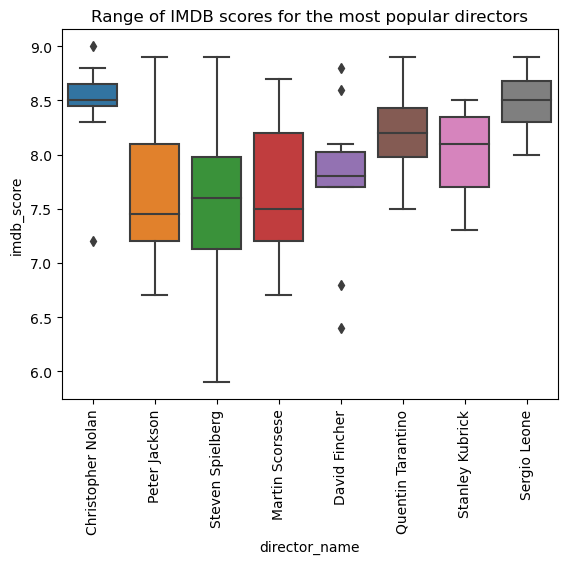

In [56]:
tmp_X = pd.get_dummies(df['director_name'])
tmp_X['imdb_score'] = df['imdb_score']
df_corr = tmp_X.corr()
corr = df_corr['imdb_score']
corr[corr>0.05]
director_name_list = corr[corr>0.05].index.tolist()
df['director_name'] = df['director_name'].astype(object)
plt.title('Range of IMDB scores for the most popular directors')
sns.boxplot(y='imdb_score',x='director_name',data=df[df['director_name'].isin(director_name_list)])
plt.xticks(rotation=90)

### <h1 style="font-family: Trebuchet MS; font-size: 18px; color: #729b79; text-align: left; "><b>Summary:</b></h1>

* ####  Director Christopher Nolan has a high score for his movies along with Sergio Leone. We can Infer that Christopher Nolan being the most popular director also has the highest percentage of movies with IMDB score of around 8.5. The quality and the performance of his movies justifies his popularity among the audience.

* ####  Steven Speilberg, David FIncher, Martin Scorsese and Quentin Tarantino movies are also highly rated and from the plot below we can see that majority of the movies from the most popular directors have IMDB score in the range of 7.0 to 8.5

<h1 style="font-family: Trebuchet MS; font-size: 25px; color: #3a5a40; text-align: left; "><b>● And more Visualization </b></h1>

([<matplotlib.patches.Wedge at 0x2b5313fcbb0>,
 [Text(-1.0906192385918172, 0.1433515832260151, 'Color'),
  Text(1.288913629746681, -0.16941562812573108, 'B/W')])

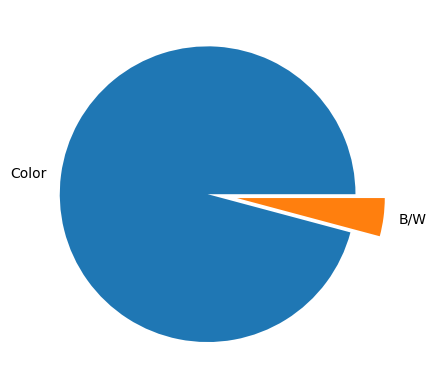

In [57]:
x = df['color'].value_counts()
names = ['Color', 'B/W']
plt.pie(x, labels=names, explode=[0.0,0.2])

### <h1 style="font-family: Trebuchet MS; font-size: 18px; color: #729b79; text-align: left; "><b>Summary:</b></h1>

* ####  Since we have the dataset of movies all the way back from 1916, some of the movies from our data are black and white. There are only 2 values in color feature, which are Color and BW films,

<h1 style="background-color:#6CA8D8;font-family: Calibri;font-weight:bold;color:#eff7f6;padding: 10px; font-size: 30px; color: #081c15;border-radius:100px 100px; text-align: center; line-height: 0.5;"><br><span style="color: #1b4332; font-size: 30px"><b id=recommender>Recommender System</b></span>

<h1 style="font-family: Trebuchet MS; font-size: 25px; color: #3a5a40; text-align: left; "><b id=simple>1. Based on movie rating </b></h1>

In [60]:
#Sort movies based on score calculated above
df2 = df.sort_values('imdb_score', ascending=False)

#Print the top 20 movies
df2[['movie_title', 'title_year', 'director_name', 'genres', 'language', 'imdb_score']].head(20)

,movie_title,title_year,director_name,genres,language,imdb_score
2765,Towering Inferno,NaN,John Blanchard,Comedy,English,9.5
1937,The Shawshank Redemption,1994.0,Frank Darabont,Crime|Drama,English,9.3
3466,The Godfather,1972.0,Francis Ford Coppola,Crime|Drama,English,9.2
4409,Kickboxer: Vengeance,2016.0,John Stockwell,Action,nan,9.1
2824,Dekalog,NaN,NaN,Drama,Polish,9.1
3207,Dekalog,NaN,NaN,Drama,Polish,9.1
66,The Dark Knight,2008.0,Christopher Nolan,Action|Crime|Drama|Thriller,English,9.0
2837,The Godfather: Part II,1974.0,Francis Ford Coppola,Crime|Drama,English,9.0
3481,Fargo,NaN,NaN,Crime|Drama|Thriller,English,9.0
339,The Lord of the Rings: The Return of the King,2003.0,Peter Jackson,Action|Adventure|Drama|Fantasy,English,8.9


### <h1 style="font-family: Trebuchet MS; font-size: 18px; color: #729b79; text-align: left; "><b>Summary:</b></h1>

* The movie recommendation system described above is fairly basic. Here, the movie's IMDB rating is taken into consideration, and recommendations are given as a result. As evidenced by this,the English comedy film Towering Inferno got the highest rating of 9.5/10.
* The Shawshank Redemption, The Godfather, and so forth come next.

<h1 style="font-family: Trebuchet MS; font-size: 25px; color: #3a5a40; text-align: left; "><b id=content>2. Content based recommending system using cosine similarity</b></h1>

<p style="color:#26947C;font-size: 18px">In this recommender system the content of the movie (director, genre, title year, actor, movie title, etc) is used to find its similarity with other movies. Then the movies that are most likely to be similar are recommended.</p>

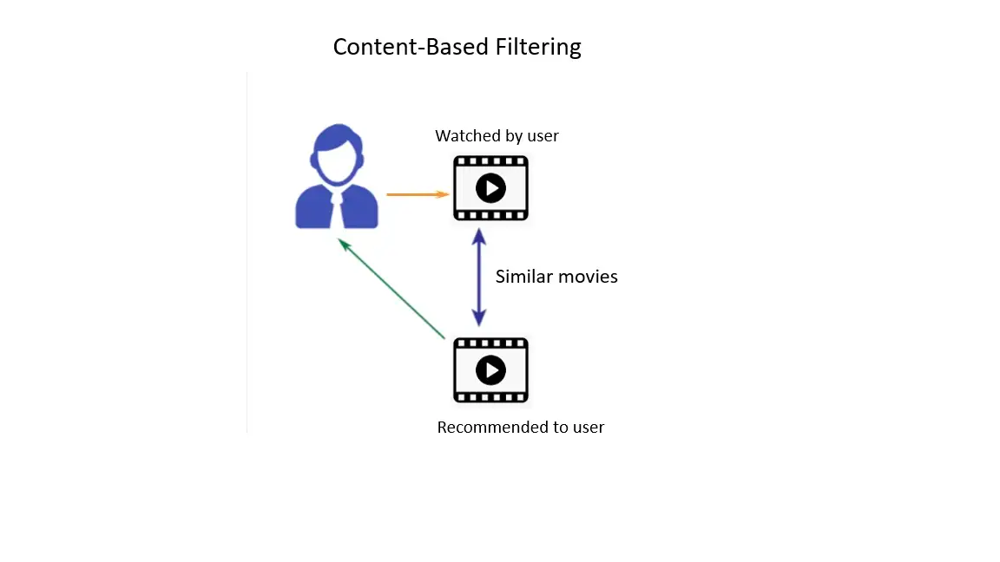

Creating and cleaning a new dataset for content based recommending system:

In [62]:

dataset= df[['director_name','actor_2_name','genres','title_year','actor_1_name','movie_title','actor_3_name']]

Formatting the genres and movie_title columns in the dataset by removing '|' :

In [63]:
dataset['genres'] = dataset['genres'].apply(lambda a: str(a).replace('|', ' '))
dataset['genres']


0       Action Adventure Fantasy Sci-Fi
1              Action Adventure Fantasy
2             Action Adventure Thriller
3                       Action Thriller
4                           Documentary
                     ...               
5038                       Comedy Drama
5039       Crime Drama Mystery Thriller
5040              Drama Horror Thriller
5041               Comedy Drama Romance
5042                        Documentary
Name: genres, Length: 5043, dtype: object

In [65]:
dataset['movie_title'] = dataset['movie_title'].apply(lambda a:a[:-1])


Combined features on which we will calculate cosine similarity:

In [66]:
dataset['director_genre_actors'] = dataset['director_name']+' '+dataset['actor_1_name']+' '+' '+dataset['actor_2_name']+' '+dataset['actor_3_name']+' '+dataset['genres']

In [67]:
dataset.fillna('', inplace=True)

In [68]:
dataset.isnull().sum()

director_name            0
actor_2_name             0
genres                   0
title_year               0
actor_1_name             0
movie_title              0
actor_3_name             0
director_genre_actors    0
dtype: int64

In [69]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

vec = CountVectorizer()
vec_matrix = vec.fit_transform(dataset['director_genre_actors'])

similarity = cosine_similarity(vec_matrix)

In [72]:
def watched_movie(movie):
    if movie not in dataset['movie_title'].unique():
        return('Sorry! The movie you requested is not in our database. Please check the spelling or try with some other movies')
    else:
        i = dataset.loc[dataset['movie_title']==movie].index[0]
        lst = list(enumerate(similarity[i]))
        lst = sorted(lst, key = lambda x:x[1] ,reverse=True)
        lst = lst[1:11] # excluding first item since it is the requested movie itself
        l = []
        year=[]
        for i in range(len(lst)):
            a = lst[i][0]
            l.append(dataset['movie_title'][a])
            year.append(dataset['title_year'][a])
            
        plt.figure(figsize=(10,5))
        plt.bar(l, [i[1] for i in lst])
        plt.xticks(rotation=90)
        plt.xlabel('Movies similar to → '+movie, fontsize=12,fontweight="bold")
        plt.ylabel('cosine scores', fontsize=12,fontweight="bold")
        plt.show()
        df2 = pd.DataFrame({'Movies Recommended':l, 'Year':year})
        df2.drop_duplicates
        return df2

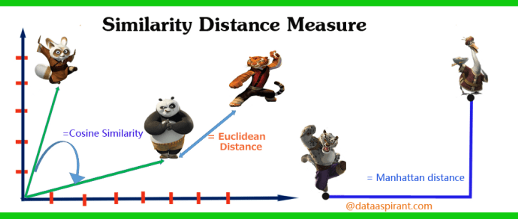

<p style="color:#26947C;font-size: 18px">Cosine similarity in the recommendation system is used with the same principle of cosine angles, where even if the similarity of the content is less similar it would be considered as the least recommended content, and for higher similarity of contents, the recommendations generated would be at the top.</p>

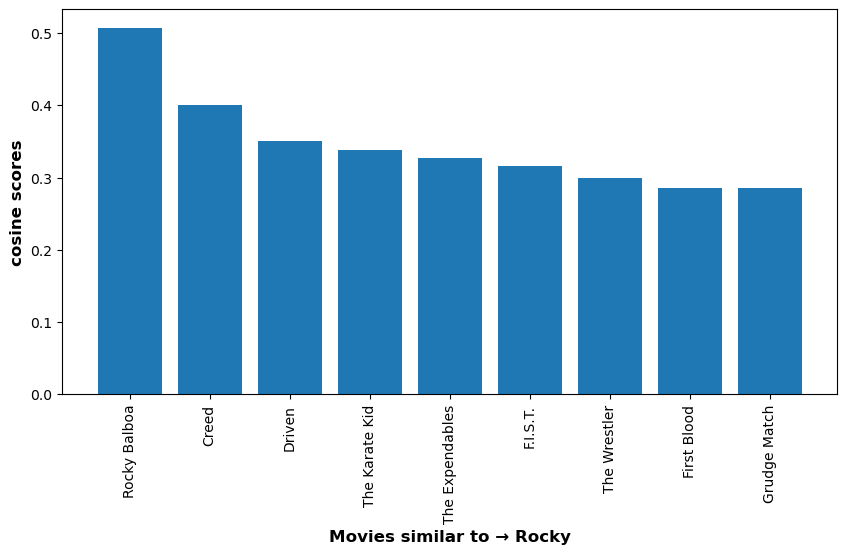

,Movies Recommended,Year
0,Rocky Balboa,2006.0
1,Creed,2015.0
2,Driven,2001.0
3,The Karate Kid,1984.0
4,The Karate Kid,1984.0
5,The Expendables,2010.0
6,F.I.S.T.,1978.0
7,The Wrestler,2008.0
8,First Blood,1982.0
9,Grudge Match,2013.0


In [73]:
watched_movie('Rocky')

### <h1 style="font-family: Trebuchet MS; font-size: 20px; color: #729b79; text-align: left; "><b>Summary:</b></h1>

* <p style="font-size: 18px;"> From the above example, we can see that if the input for function is passed as the movie 'Rocky' then we get the movie recommendation based on the same genre, actors and directors which are extremely similar like Rocky Balboa, Creed, Karate Kid and so on.</p>


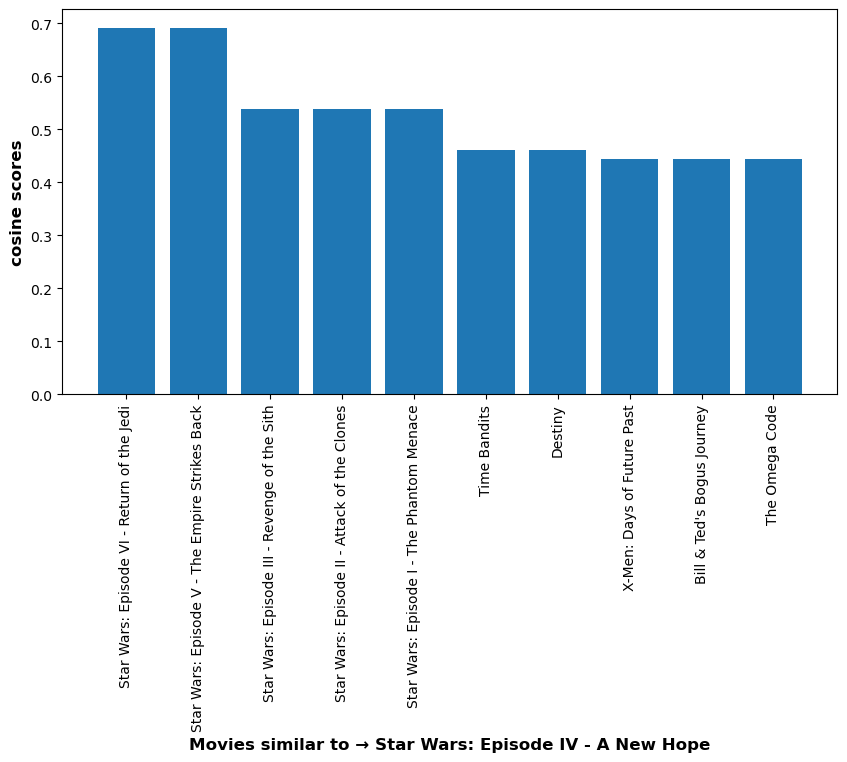

,Movies Recommended,Year
0,Star Wars: Episode VI - Return of the Jedi,1983.0
1,Star Wars: Episode V - The Empire Strikes Back,1980.0
2,Star Wars: Episode III - Revenge of the Sith,2005.0
3,Star Wars: Episode II - Attack of the Clones,2002.0
4,Star Wars: Episode I - The Phantom Menace,1999.0
5,Time Bandits,1981.0
6,Destiny,2014.0
7,X-Men: Days of Future Past,2014.0
8,Bill & Ted's Bogus Journey,1991.0
9,The Omega Code,1999.0


In [90]:
watched_movie('Star Wars: Episode IV - A New Hope')

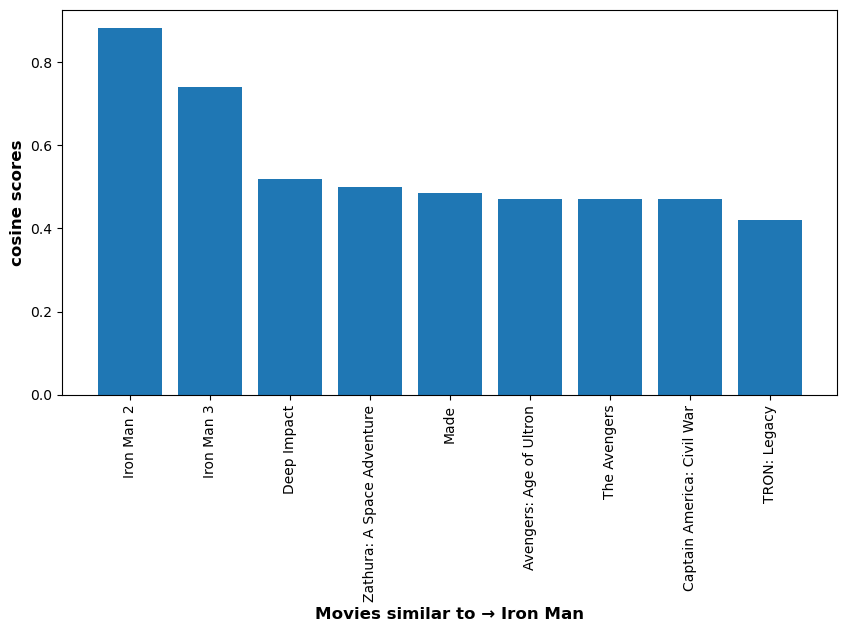

,Movies Recommended,Year
0,Iron Man 2,2010.0
1,Iron Man 3,2013.0
2,Deep Impact,1998.0
3,Zathura: A Space Adventure,2005.0
4,Made,2001.0
5,Avengers: Age of Ultron,2015.0
6,The Avengers,2012.0
7,Captain America: Civil War,2016.0
8,The Avengers,2012.0
9,TRON: Legacy,2010.0


In [91]:
watched_movie('Iron Man')

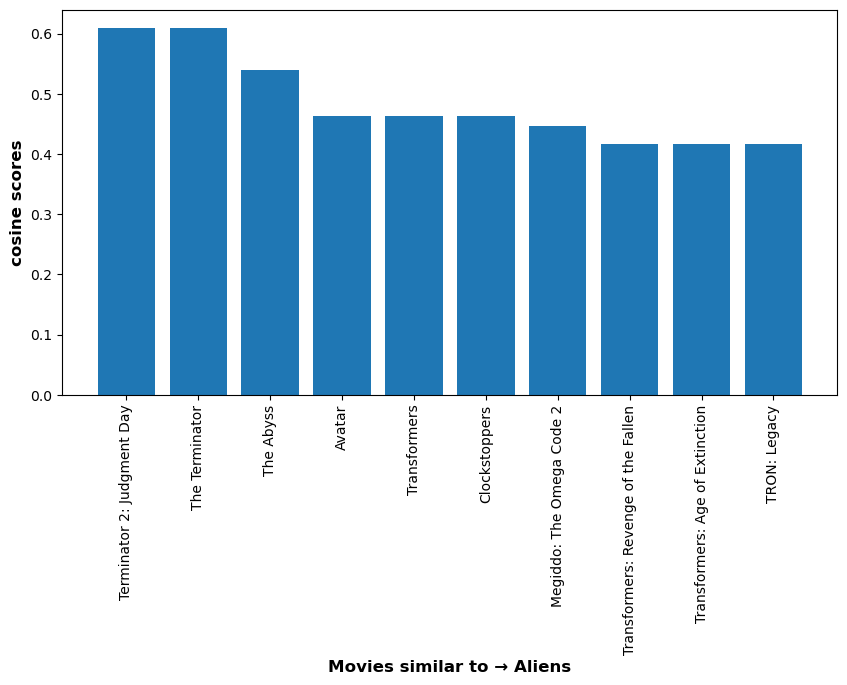

,Movies Recommended,Year
0,Terminator 2: Judgment Day,1991.0
1,The Terminator,1984.0
2,The Abyss,1989.0
3,Avatar,2009.0
4,Transformers,2007.0
5,Clockstoppers,2002.0
6,Megiddo: The Omega Code 2,2001.0
7,Transformers: Revenge of the Fallen,2009.0
8,Transformers: Age of Extinction,2014.0
9,TRON: Legacy,2010.0


In [93]:
watched_movie('Aliens')

### <h1 style="font-family: Trebuchet MS; font-size: 20px; color: #729b79; text-align: left; "><b>Summary:</b></h1>

* <p style="font-size: 18px;"> Similarly, for movies such as Star Wars, we get the recommendation of all the Star Wars episode.</p>
* <p style="font-size: 18px;"> For movie Iron Man, movies from the Marvel Universe are recommended.</p>
* <p style="font-size: 18px;"> And if we watch movie Aliens then we get suggestions such as Terminator 2, Avatar and so on which are directed by the person or have the same genre.</p>


<h1 style="font-family: Trebuchet MS; font-size: 25px; color: #3a5a40; text-align: left; "><b id=collaborative>2. Collaborative Filtering Recommeder System (TensorFlow | Deep Learning) </b></h1>


* <p style="color:#26947C;font-size: 18px"> Tensorflow comes with a library called TensorFlow Recommenders (TFRS) for building a recommender system. It's built on Keras and aims to have a gentle learning curve while still giving you the flexibility to build complex models.</p>


*  <p style="color:#26947C;font-size: 18px">Our content based engine suffers from some severe limitations. It is only capable of suggesting movies which are close to a certain movie. That is, it is not capable of capturing tastes and providing recommendations across genres. </p>


*  <p style="color:#26947C;font-size: 18px">Also, the engine that we built is not really personal in that it doesn't capture the personal tastes and biases of a user. Anyone querying our engine for recommendations based on a movie will receive the same recommendations for that movie, regardless of who she/he is.</p>


*    <p style="color:#26947C;font-size: 18px">Collaborative filtration strategy is based on the combination of the user’s behavior and comparing and contrasting that with other users’ behavior in the database. The history of all users plays an important role in this algorithm. The main difference between content-based filtering and collaborative filtering that in the latter, the interaction of all users with the items influences the recommendation algorithm while for content-based filtering only the concerned user’s data is taken into account. </p>

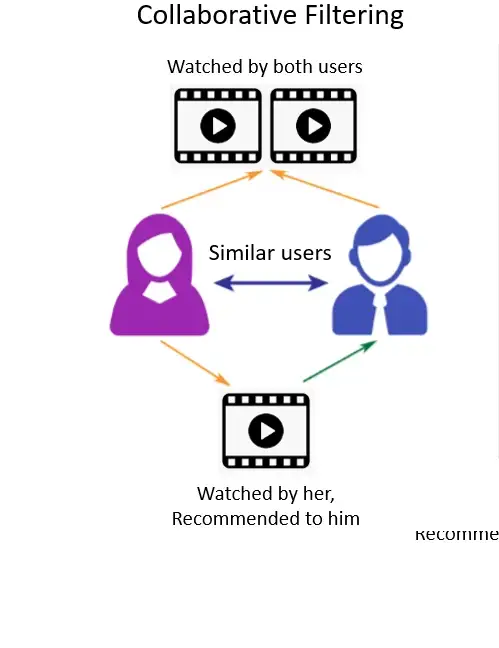

In [102]:
!pip install tensorflow

     ------------------------------------- 266.3/266.3 MB 12.3 MB/s eta 0:00:00
     ---------------------------------------- 3.7/3.7 MB 47.8 MB/s eta 0:00:00
     ---------------------------------------- 1.5/1.5 MB 47.6 MB/s eta 0:00:00
     -------------------------------------- 124.6/124.6 kB 7.6 MB/s eta 0:00:00
     ------------------------------------- 895.9/895.9 kB 55.4 MB/s eta 0:00:00
     ---------------------------------------- 57.5/57.5 kB 3.0 MB/s eta 0:00:00
     ---------------------------------------- 439.2/439.2 kB ? eta 0:00:00
     ---------------------------------------- 6.0/6.0 MB 47.8 MB/s eta 0:00:00
     --------------------------------------- 14.2/14.2 MB 46.7 MB/s eta 0:00:00
     ---------------------------------------- 1.7/1.7 MB 35.6 MB/s eta 0:00:00
     ---------------------------------------- 65.5/65.5 kB 3.5 MB/s eta 0:00:00
     ------------------------------------- 781.3/781.3 kB 48.2 MB/s eta 0:00:00
     ------------------------------------- 177.0/

In [104]:
!pip install tensorflow_recommenders

     ---------------------------------------- 89.3/89.3 kB 5.3 MB/s eta 0:00:00


In [105]:

import string
import re
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_recommenders as tfrs
from collections import Counter
from typing import Dict, Text
from ast import literal_eval
from datetime import datetime
from wordcloud import WordCloud
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

import warnings
warnings.filterwarnings('ignore')


In [106]:
credits = pd.read_csv('C:\\Users\\mahes\\Downloads\\ratings_small\\credits.csv')
keywords = pd.read_csv('C:\\Users\\mahes\\Downloads\\ratings_small\\keywords.csv')
movies = pd.read_csv('C:\\Users\\mahes\\Downloads\\ratings_small\\movies_metadata.csv').\
                     drop(['belongs_to_collection', 'homepage', 'imdb_id', 'poster_path', 'status', 'title', 'video'], axis=1).\
                     drop([19730, 29503, 35587]) # Incorrect data type

movies['id'] = movies['id'].astype('int64')

df = movies.merge(keywords, on='id').\
    merge(credits, on='id')

df['original_language'] = df['original_language'].fillna('')
df['runtime'] = df['runtime'].fillna(0)
df['tagline'] = df['tagline'].fillna('')

df.dropna(inplace=True)

def get_text(text, obj='name'):
    text = literal_eval(text)
    
    if len(text) == 1:
        for i in text:
            return i[obj]
    else:
        s = []
        for i in text:
            s.append(i[obj])
        return ', '.join(s)
    
df['genres'] = df['genres'].apply(get_text)
df['production_companies'] = df['production_companies'].apply(get_text)
df['production_countries'] = df['production_countries'].apply(get_text)
df['crew'] = df['crew'].apply(get_text)
df['spoken_languages'] = df['spoken_languages'].apply(get_text)
df['keywords'] = df['keywords'].apply(get_text)

# New columns
df['characters'] = df['cast'].apply(get_text, obj='character')
df['actors'] = df['cast'].apply(get_text)

df.drop('cast', axis=1, inplace=True)
df = df[~df['original_title'].duplicated()]
df = df.reset_index(drop=True)

In [108]:
ratings_df = pd.read_csv('C:\\Users\\mahes\\Downloads\\ratings_small\\ratings_small.csv')

ratings_df['date'] = ratings_df['timestamp'].apply(lambda x: datetime.fromtimestamp(x))
ratings_df.drop('timestamp', axis=1, inplace=True)

ratings_df = ratings_df.merge(df[['id', 'original_title', 'genres', 'overview']], left_on='movieId',right_on='id', how='left')
ratings_df = ratings_df[~ratings_df['id'].isna()]
ratings_df.drop('id', axis=1, inplace=True)
ratings_df.reset_index(drop=True, inplace=True)

ratings_df.head()

,userId,movieId,rating,date,original_title,genres,overview
0,1,1371,2.5,2009-12-13 21:52:15,Rocky III,Drama,"Now the world champion, Rocky Balboa is living..."
1,1,1405,1.0,2009-12-13 21:53:23,Greed,"Drama, History",Greed is the classic 1924 silent film by Erich...
2,1,2105,4.0,2009-12-13 21:52:19,American Pie,"Comedy, Romance","At a high-school party, four friends find that..."
3,1,2193,2.0,2009-12-13 21:53:18,My Tutor,"Comedy, Drama, Romance",High school senior Bobby Chrystal fails his Fr...
4,1,2294,2.0,2009-12-13 21:51:48,Jay and Silent Bob Strike Back,Comedy,When Jay and Silent Bob learn that their comic...


In [109]:
movies_df = df[['id', 'original_title']]
movies_df.rename(columns={'id':'movieId'}, inplace=True)
movies_df.head()

,movieId,original_title
0,862,Toy Story
1,8844,Jumanji
2,15602,Grumpier Old Men
3,31357,Waiting to Exhale
4,11862,Father of the Bride Part II


In [110]:
ratings_df['userId'] = ratings_df['userId'].astype(str)

ratings = tf.data.Dataset.from_tensor_slices(dict(ratings_df[['userId', 'original_title', 'rating']]))
movies = tf.data.Dataset.from_tensor_slices(dict(movies_df[['original_title']]))

ratings = ratings.map(lambda x: {
    "original_title": x["original_title"],
    "userId": x["userId"],
    "rating": float(x["rating"])
})

movies = movies.map(lambda x: x["original_title"])

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


In [111]:
print('Total Data: {}'.format(len(ratings)))

tf.random.set_seed(42)
shuffled = ratings.shuffle(100_000, seed=42, reshuffle_each_iteration=False)

train = ratings.take(35_000)
test = ratings.skip(35_000).take(8_188)

Total Data: 43188


In [112]:
movie_titles = movies.batch(1_000)
user_ids = ratings.batch(1_000).map(lambda x: x["userId"])

unique_movie_titles = np.unique(np.concatenate(list(movie_titles)))
unique_user_ids = np.unique(np.concatenate(list(user_ids)))

print('Unique Movies: {}'.format(len(unique_movie_titles)))
print('Unique users: {}'.format(len(unique_user_ids)))

Unique Movies: 42373
Unique users: 671


In [113]:
class MovieModel(tfrs.models.Model):

  def __init__(self, rating_weight: float, retrieval_weight: float) -> None:
    # We take the loss weights in the constructor: this allows us to instantiate
    # several model objects with different loss weights.

    super().__init__()

    embedding_dimension = 64

    # User and movie models.
    self.movie_model: tf.keras.layers.Layer = tf.keras.Sequential([
      tf.keras.layers.StringLookup(
        vocabulary=unique_movie_titles, mask_token=None),
      tf.keras.layers.Embedding(len(unique_movie_titles) + 1, embedding_dimension)
    ])
    self.user_model: tf.keras.layers.Layer = tf.keras.Sequential([
      tf.keras.layers.StringLookup(
        vocabulary=unique_user_ids, mask_token=None),
      tf.keras.layers.Embedding(len(unique_user_ids) + 1, embedding_dimension)
    ])

    # A small model to take in user and movie embeddings and predict ratings.
    # We can make this as complicated as we want as long as we output a scalar
    # as our prediction.
    self.rating_model = tf.keras.Sequential([
        tf.keras.layers.Dense(256, activation="relu"),
        tf.keras.layers.Dense(128, activation="relu"),
        tf.keras.layers.Dense(1),
    ])

    # The tasks.
    self.rating_task: tf.keras.layers.Layer = tfrs.tasks.Ranking(
        loss=tf.keras.losses.MeanSquaredError(),
        metrics=[tf.keras.metrics.RootMeanSquaredError()],
    )
    self.retrieval_task: tf.keras.layers.Layer = tfrs.tasks.Retrieval(
        metrics=tfrs.metrics.FactorizedTopK(
            candidates=movies.batch(128).map(self.movie_model)
        )
    )

    # The loss weights.
    self.rating_weight = rating_weight
    self.retrieval_weight = retrieval_weight

  def call(self, features: Dict[Text, tf.Tensor]) -> tf.Tensor:
    # We pick out the user features and pass them into the user model.
    user_embeddings = self.user_model(features["userId"])
    # And pick out the movie features and pass them into the movie model.
    movie_embeddings = self.movie_model(features["original_title"])
    
    return (
        user_embeddings,
        movie_embeddings,
        # We apply the multi-layered rating model to a concatentation of
        # user and movie embeddings.
        self.rating_model(
            tf.concat([user_embeddings, movie_embeddings], axis=1)
        ),
    )

  def compute_loss(self, features: Dict[Text, tf.Tensor], training=False) -> tf.Tensor:

    ratings = features.pop("rating")

    user_embeddings, movie_embeddings, rating_predictions = self(features)

    # We compute the loss for each task.
    rating_loss = self.rating_task(
        labels=ratings,
        predictions=rating_predictions,
    )
    retrieval_loss = self.retrieval_task(user_embeddings, movie_embeddings)

    # And combine them using the loss weights.
    return (self.rating_weight * rating_loss
            + self.retrieval_weight * retrieval_loss)

In [114]:
model = MovieModel(rating_weight=1.0, retrieval_weight=1.0)
model.compile(optimizer=tf.keras.optimizers.Adagrad(0.1))

cached_train = train.shuffle(100_000).batch(1_000).cache()
cached_test = test.batch(1_000).cache()

model.fit(cached_train, epochs=3)

Epoch 1/3
35/35 [==============================] - 21s 526ms/step - root_mean_squared_error: 1.4216 - factorized_top_k/top_1_categorical_accuracy: 3.7143e-04 - factorized_top_k/top_5_categorical_accuracy: 0.0071 - factorized_top_k/top_10_categorical_accuracy: 0.0181 - factorized_top_k/top_50_categorical_accuracy: 0.1028 - factorized_top_k/top_100_categorical_accuracy: 0.1729 - loss: 6810.4104 - regularization_loss: 0.0000e+00 - total_loss: 6810.4104
Epoch 2/3
35/35 [==============================] - 25s 717ms/step - root_mean_squared_error: 1.0238 - factorized_top_k/top_1_categorical_accuracy: 0.0012 - factorized_top_k/top_5_categorical_accuracy: 0.0198 - factorized_top_k/top_10_categorical_accuracy: 0.0448 - factorized_top_k/top_50_categorical_accuracy: 0.2016 - factorized_top_k/top_100_categorical_accuracy: 0.3177 - loss: 6454.2310 - regularization_loss: 0.0000e+00 - total_loss: 6454.2310
Epoch 3/3
35/35 [==============================] - 26s 738ms/step - root_mean_squared_error: 1.0

In [115]:
metrics = model.evaluate(cached_test, return_dict=True)

print(f"\nRetrieval top-100 accuracy: {metrics['factorized_top_k/top_100_categorical_accuracy']:.3f}")
print(f"Ranking RMSE: {metrics['root_mean_squared_error']:.3f}")

9/9 [==============================] - 4s 324ms/step - root_mean_squared_error: 1.2404 - factorized_top_k/top_1_categorical_accuracy: 7.3278e-04 - factorized_top_k/top_5_categorical_accuracy: 0.0046 - factorized_top_k/top_10_categorical_accuracy: 0.0100 - factorized_top_k/top_50_categorical_accuracy: 0.0408 - factorized_top_k/top_100_categorical_accuracy: 0.0744 - loss: 5726.5920 - regularization_loss: 0.0000e+00 - total_loss: 5726.5920

Retrieval top-100 accuracy: 0.074
Ranking RMSE: 1.240


In [116]:
def predict_movie(user, top_n=3):
    # Create a model that takes in raw query features, and
    index = tfrs.layers.factorized_top_k.BruteForce(model.user_model)
    # recommends movies out of the entire movies dataset.
    index.index_from_dataset(
      tf.data.Dataset.zip((movies.batch(100), movies.batch(100).map(model.movie_model)))
    )

    # Get recommendations.
    _, titles = index(tf.constant([str(user)]))
    
    print('Top {} recommendations for user {}:\n'.format(top_n, user))
    for i, title in enumerate(titles[0, :top_n].numpy()):
        print('{}. {}'.format(i+1, title.decode("utf-8")))

def predict_rating(user, movie):
    trained_movie_embeddings, trained_user_embeddings, predicted_rating = model({
          "userId": np.array([str(user)]),
          "original_title": np.array([movie])
      })
    print("Predicted rating for {}: {}".format(movie, predicted_rating.numpy()[0][0]))


In [117]:
predict_movie(123, 5)

Top 5 recommendations for user 123:

1. The Greatest Story Ever Told
2. Scary Movie
3. Jezebel
4. Un long dimanche de fiançailles
5. Furankenshutain no Kaijū: Sanda tai Gaira


In [118]:
predict_rating(123,'Minions')

Predicted rating for Minions: 2.557319402694702


le't examine User 123 from historical data

In [119]:
ratings_df[ratings_df['userId'] == '123']

,userId,movieId,rating,date,original_title,genres,overview
8053,123,233,4.0,2001-07-01 16:57:06,The Wanderers,Drama,The streets of the Bronx are owned by 60’s you...
8054,123,288,5.0,2001-07-01 15:32:47,High Noon,Western,High Noon is about a recently freed leader of ...
8055,123,407,5.0,2001-07-01 16:57:57,Kurz und schmerzlos,"Drama, Thriller",Three friends get caught in a life of major cr...
8056,123,968,3.0,2001-07-01 16:59:01,Dog Day Afternoon,"Crime, Drama, Thriller",A man robs a bank to pay for his lover's opera...
8057,123,1968,4.0,2001-07-01 15:30:36,Fools Rush In,"Drama, Comedy, Romance",Alex Whitman (Matthew Perry) is a designer fro...
8058,123,1976,4.0,2001-07-01 15:31:51,Jezebel,"Drama, Romance","In 1850s Louisiana, the willfulness of a tempe..."
8059,123,2003,4.0,2001-07-01 15:31:51,Anatomie de l'enfer,Drama,A man rescues a woman from a suicide attempt i...
8060,123,2428,5.0,2001-07-01 16:57:06,The Greatest Story Ever Told,"Drama, History",All-star epic retelling of Christ's life.
8061,123,2502,5.0,2001-07-01 16:59:01,The Bourne Supremacy,"Action, Drama, Thriller",When a CIA operation to purchase classified Ru...
8062,123,2762,5.0,2001-07-01 16:59:54,Young and Innocent,"Drama, Crime",Derrick De Marney finds himself in a 39 Steps ...


In [120]:
# Get meta data for predicted movie
index = tfrs.layers.factorized_top_k.BruteForce(model.user_model)
# recommends movies out of the entire movies dataset.
index.index_from_dataset(
  tf.data.Dataset.zip((movies.batch(100), movies.batch(100).map(model.movie_model)))
)

# Get recommendations.
_, titles = index(tf.constant(['123']))
pred_movies = pd.DataFrame({'original_title': [i.decode('utf-8') for i in titles[0,:5].numpy()]})

pred_df = pred_movies.merge(ratings_df[['original_title', 'genres', 'overview']], on='original_title', how='left')
pred_df = pred_df[~pred_df['original_title'].duplicated()]
pred_df.reset_index(drop=True, inplace=True)
pred_df.index = np.arange(1, len(pred_df)+1)

pred_df

,original_title,genres,overview
1,The Greatest Story Ever Told,"Drama, History",All-star epic retelling of Christ's life.
2,Scary Movie,Comedy,Following on the heels of popular teen-scream ...
3,Jezebel,"Drama, Romance","In 1850s Louisiana, the willfulness of a tempe..."
4,Un long dimanche de fiançailles,Drama,"In 1919, Mathilde was 19 years old. Two years ..."
5,Furankenshutain no Kaijū: Sanda tai Gaira,"Action, Horror, Science Fiction",An experimental lab animal called a gargantua ...


In [121]:
predict_movie(555, 5)

Top 5 recommendations for user 555:

1. Dirty Dancing
2. Good bye, Lenin!
3. Because I Said So
4. The Fifth Element
5. Il buono, il brutto, il cattivo


In [123]:
predict_rating(555,'Man of Steel')

Predicted rating for Man of Steel: 2.5619235038757324


In [124]:
# Get meta data for predicted movie
index = tfrs.layers.factorized_top_k.BruteForce(model.user_model)
# recommends movies out of the entire movies dataset.
index.index_from_dataset(
  tf.data.Dataset.zip((movies.batch(100), movies.batch(100).map(model.movie_model)))
)

# Get recommendations.
_, titles = index(tf.constant(['555']))
pred_movies = pd.DataFrame({'original_title': [i.decode('utf-8') for i in titles[0,:5].numpy()]})

pred_df = pred_movies.merge(ratings_df[['original_title', 'genres', 'overview']], on='original_title', how='left')
pred_df = pred_df[~pred_df['original_title'].duplicated()]
pred_df.reset_index(drop=True, inplace=True)
pred_df.index = np.arange(1, len(pred_df)+1)

pred_df

,original_title,genres,overview
1,Dirty Dancing,"Drama, Music, Romance",Expecting the usual tedium that accompanies a ...
2,"Good bye, Lenin!","Comedy, Drama, Romance",An affectionate and refreshing East/West-Germa...
3,Because I Said So,Comedy,In an effort to prevent family history from re...
4,The Fifth Element,"Adventure, Fantasy, Action, Thriller, Science ...","In 2257, a taxi driver is unintentionally give..."
5,"Il buono, il brutto, il cattivo",Western,While the Civil War rages between the Union an...






### <h1 style="font-family: Trebuchet MS; font-size: 20px; color: #729b79; text-align: left; "><b>Insights:</b></h1>

* <p style="font-size: 18px;"> We can see right away that User 123 enjoys viewing drama films the most of the time. Additionally, he or she gives the genre a positive rating. In our proposal, we provide five additional drama films that we believe the person will enjoy just as much as the films they have already seen.</p>


* <p style="font-size: 18px;"> We don't find any animation films that User 123 has seen in our dataset. Hence, the low rating for Minion movie.
</p>


* <p style="font-size: 18px;"> If we run the select a differnt user id and perform the same analysis, we could see that user has rated the movie "Man of Steel" quite low as compared to movie that has Drama and Romance.
</p>


* <p style="font-size: 18px;"> The top picks for user 555 are Dirty Dancing, Good bye Lenin and so on which are displayed on the table above.
</p>

<h1 style="background-color:#6CA8D8;font-family: Calibri;font-weight:bold;color:#eff7f6;padding: 10px; font-size: 30px; color: #081c15;border-radius:100px 100px; text-align: center; line-height: 0.5;"><br><span style="color: #1b4332; font-size: 30px"><b id=summary>Summary</b></span>

* <p style="font-size: 18px;color: #729b79"> In this notebook, we created 3 movie recommending system which are based on 
    
    1. Recommendation based on highly rated movies.
    
    2. Content based recommendation.
    
    3. Collaborative filtering based recommendation (DEEP Learning using TensorFlow framework)
    </p>
    

* <p style="font-size: 18px;color: #729b79"> Initially, we performed EDA which suggested:
    
    1. Budget and Revenue just slighly influence the popularity of the movies
    2. Drama,comedy, Sci Fi and Crime Drama are the most dominant genre
    3. Movie Released after 1990 seems to have been significantly increased.
    4. Maximum number of movies have been rated as R followed by PG-13,PG and so on.
    5. The most popular movies have an imdb score of 6 or more and the ones with low popularity have comparatively less rating.
    6. The highest and lowest rated movie is in English language that also suggest that it has the most outliers compared to others. Japenese, Italian and Swedish language movies have a good amount of high scored movies followed by Hindi and Russian language movies.
    7. Significant rise in the number of total movies made that was observed around year 2009 was infact due to the growth of American film industry. This can also be observed in IMDB score, the distribution for USA is narrow and also spread over much greater area as compared to all the other countries.
    8. Majority of the movies from the most popular directors have IMDB score in the range of 7.0 to 8.5.
    
    </p>
    
* <p style="font-size: 18px;color: #729b79"> Content Based Movie Recommendation
    
    Using cosine similarity method, movies are recommended based on the director, genre, title year, actor and movie title. The more similarity as movie has based on these parameters, the movie is likely to recommended else if will it have the least possibility of getting recommended. As the example list in that section, we can see that if the input for the function is passed as the movie 'Rocky' then we get the movie recommendation based on the same genre, actors and directors which are extremely similar like Rocky Balboa, Creed, Karate Kid and so on.</p>
    

* <p style="font-size: 18px;color: #729b79"> Collaborative Filtering Based Movie Recommendation (DEEP Learning)
    
    Collaborative filtration strategy is based on the combination of the user’s behavior and comparing and contrasting that with other users’ behavior in the database. The history of all users plays an important role in this algorithm. The main difference between content-based filtering and collaborative filtering that in the latter, the interaction of all users with the items influences the recommendation algorithm while for content-based filtering only the concerned user’s data is taken into account.
 For example, in our dataset and example, we could see that user 123 prefers movies that have drama as their genre so the top recommendations returned are drama movies like 'The greatest story ever told' and 'jezebel'. Similarly, the prediction for movie rating of an animated movie returns a lower rating of 2.5. 